In [1]:
import pandas as pd
import geopandas as gp
import numpy as np 
import os
import fiona
from statistics import mean, median
import string
import sys
import matplotlib.pyplot as plt

## Election Results

Election results primarily from the California Statewide Database (https://statewidedatabase.org/d10/g20.html).

## Election Results Processing

Precinct results that were combined by the Statewide Database were separated according to the 2020 Statement of the Vote from the registrars of the following counties: Glenn, El Dorado, Imperial, Inyo, Madera, Mendocino, San Joaquin, San Luis Obispo, Shasta, Sierra, Siskiyou, Sutter, Tuolumne.

Butte County amended its precinct results after the state certification deadline. The amended results are higher than the certified results as follows: Biden (D) +389, Trump (R) +89, Jorgensen (L) + 15, Hawkins (G) + 3, De La Fuente (A) + 2, La Riva (S) +1. The precinct results for Sutter County add 1 Biden vote and 2 Trump votes more than the certified totals. 
In Los Angeles County a scattering of ballots were reported by canvassing batch rather than by precinct. These add up to 54 Biden votes and 23 Trump votes. In San Diego County a scattering of ballots were reported from VBM "pseudo" precincts that are not assigned to a polling location. These add up to 93 Biden votes, 69 Trump votes, and 3 Jorgensen votes. 

## Shape Files

Precinct shapefiles were obtained directly from nearly all counties. The precinct shapefiles for Modoc County and Sierra County were obtained from the Los Angeles Times Data Desk GitHub. For Trinity County the precinct shapefile was generated using the parcel precinct assignments in the General Plan shapefile. California counties routinely consolidate precincts based on polling place assignments and ballot styles for a given election. The majority of the county shapefiles featured regular precincts rather than consolidated precincts. Wherever necessary the registration precincts were consolidated to match the election results using the November 2020 consolidation reports from the respective counties.

## Shape File Processing

In Sierra County, Precinct 23 (Sierra City 4) was added according to the 2018 PDF map provided by the county clerk. In Imperial County, Siskiyou County, and Sutter County regular precincts were split using water districts, fire districts, and school districts, respectively, consistent with the November 2020 district reports. In Siskiyou County, Weed 1 and Weed 2 were split using the voter assignment street list and the parcel shapefile.

A scattering of precincts in Los Angeles County do not feature a district assignment for either California State Senate or for Board of Equalization. In these instances the consolidated precincts cross district boundaries in areas where the relevant districts were not on the ballot for the November 2020 general election.


## RDH Note 
 - Precinct results for Glenn, El Dorado, Imperial, Inyo, Madera, Mendocino, San Joaquin, San Luis Obispo, Shasta, Sierra, Siskiyou, Sutter, Tuolumne Counties were deconsolidated based on county reports from each county.
 
 - 0 Vote Precinct results in various counties were removed from the vest shape that did not have a join match in the county election results files
 - VEST forgot to deconsolidate in Glenn County 10091 to 10092 and 91, 10050 to 50 and 51, 10120 to 20 and 21, 30061 to 61 and 62(62 is 0 votes) and lastly 50061 to 61 and 62 according to the county wide reports 
 - In San Joaquin County VEST consolidated 11304 to 11233 instead of 11303 and 91209 to 91203
 - In Imperial County VEST consolidated 585272 to 582224
 - Shape files were not able to be validated from the statewide database, however it seems that shape files sourced from the county level match VEST's findings atleast in the spot check of Alameda County
 - 
 



## Races

 - G20PREDBID - Joseph R. Biden (Democratic Party)
 - G20PRERTRU - Donald J. Trump (Republican Party)
 - G20PRELJOR - Jo Jorgensen (Libertarian Party)
 - G20PREGHAW - Howie Hawkins (Green Party)
 - G20PREAFUE - Roque "Rocky" De La Fuente Guerra (American Independent Party)
 - G20PREPLAR - Gloria La Riva (Peace and Freedom Party)

In [2]:
vest_shp = gp.read_file("./raw-from-source/vest/ca_2020.shp", crs='3857')

In [3]:
vest_shp.shape

(20799, 16)

In [4]:
vest_shp.head()

,COUNTY,CNTY_CODE,FIPS_CODE,SRPREC_KEY,SRPREC,ADDIST,CDDIST,SDDIST,BEDIST,G20PREDBID,G20PRERTRU,G20PRELJOR,G20PREGHAW,G20PREAFUE,G20PREPLAR,geometry
0,Alameda,1,6001,6001481430,481430,20,15,10,2,0,0,0,0,0,0,"POLYGON ((-13591389.953 4534199.875, -13591391..."
1,Alameda,1,6001,6001430420,430420,20,15,10,2,0,0,0,0,0,0,"POLYGON ((-13591791.751 4534039.872, -13591792..."
2,Alameda,1,6001,6001430410,430410,20,15,10,2,3,1,0,0,0,0,"POLYGON ((-13591451.086 4533620.113, -13591468..."
3,Alameda,1,6001,6001430500,430500,20,15,10,2,1,0,0,0,0,0,"POLYGON ((-13591463.435 4534097.046, -13591464..."
4,Alameda,1,6001,6001430130,430130,20,15,10,2,0,0,0,0,0,0,"POLYGON ((-13591792.296 4532623.256, -13591794..."


<AxesSubplot:>

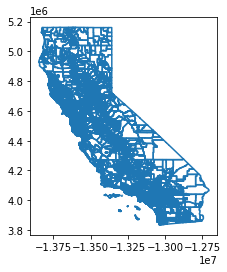

In [5]:
vest_shp.boundary.plot()

<AxesSubplot:>

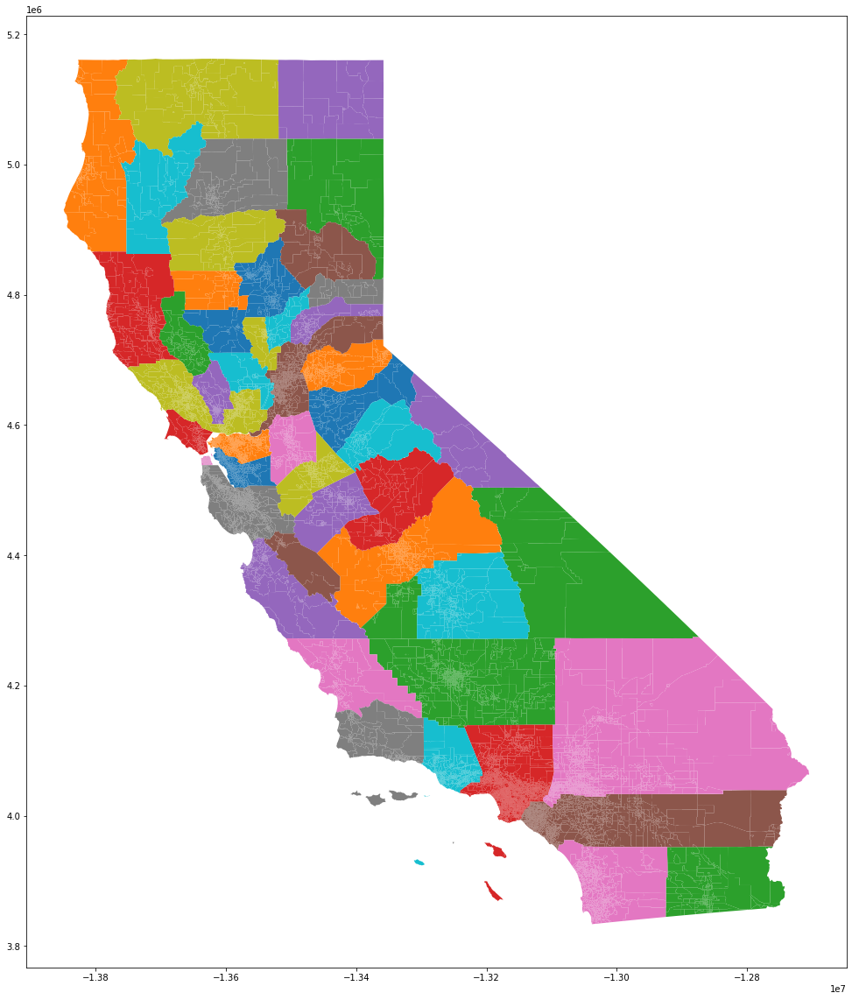

In [6]:
vest_shp.plot(column='COUNTY', figsize=(20,20))

In [7]:
vest_shp.columns


Index(['COUNTY', 'CNTY_CODE', 'FIPS_CODE', 'SRPREC_KEY', 'SRPREC', 'ADDIST',
       'CDDIST', 'SDDIST', 'BEDIST', 'G20PREDBID', 'G20PRERTRU', 'G20PRELJOR',
       'G20PREGHAW', 'G20PREAFUE', 'G20PREPLAR', 'geometry'],
      dtype='object')

## Load the Statewide Election Results File

In [8]:
ca_20 = pd.read_csv("./raw-from-source/source/state results fixed.csv", index_col=False)

In [9]:
ca_20.head()

,COUNTY,FIPS,SRPREC_KEY,SRPREC,TOTREG,TOTVOTE,PRSDEM01,PRSREP01,PRSPAF01,PRSAIP01,PRSGRN01,PRSLIB01,Unnamed: 12,Unnamed: 13,Unnamed: 14
0,1,6001,6001200100,200100,3538.0,3156.0,2927.0,146,9,7.0,16.0,15,NaN,NaN,NaN
1,1,6001,6001200200,200200,1975.0,1764.0,1631.0,76,4,3.0,22.0,8,NaN,NaN,NaN
2,1,6001,6001201400,201400,2682.0,2293.0,2155.0,65,11,1.0,19.0,11,NaN,NaN,NaN
3,1,6001,6001201800,201800,1989.0,1446.0,1289.0,77,15,6.0,23.0,15,NaN,NaN,NaN
4,1,6001,6001202010,202010,248.0,189.0,175.0,5,0,0.0,5.0,1,NaN,NaN,NaN


In [10]:
ca_20.shape

(21413, 15)

In [11]:
ca_20.head()

,COUNTY,FIPS,SRPREC_KEY,SRPREC,TOTREG,TOTVOTE,PRSDEM01,PRSREP01,PRSPAF01,PRSAIP01,PRSGRN01,PRSLIB01,Unnamed: 12,Unnamed: 13,Unnamed: 14
0,1,6001,6001200100,200100,3538.0,3156.0,2927.0,146,9,7.0,16.0,15,NaN,NaN,NaN
1,1,6001,6001200200,200200,1975.0,1764.0,1631.0,76,4,3.0,22.0,8,NaN,NaN,NaN
2,1,6001,6001201400,201400,2682.0,2293.0,2155.0,65,11,1.0,19.0,11,NaN,NaN,NaN
3,1,6001,6001201800,201800,1989.0,1446.0,1289.0,77,15,6.0,23.0,15,NaN,NaN,NaN
4,1,6001,6001202010,202010,248.0,189.0,175.0,5,0,0.0,5.0,1,NaN,NaN,NaN


In [12]:
ca_20.columns

Index(['COUNTY', 'FIPS', 'SRPREC_KEY', 'SRPREC', 'TOTREG', 'TOTVOTE',
       'PRSDEM01', 'PRSREP01', 'PRSPAF01', 'PRSAIP01', 'PRSGRN01', 'PRSLIB01',
       'Unnamed: 12', 'Unnamed: 13', 'Unnamed: 14'],
      dtype='object')

## Clean Up the Elections Results

In [13]:
#filter needed columns
filtered_20 = ca_20[['COUNTY','SRPREC_KEY','SRPREC','PRSDEM01','PRSREP01','PRSPAF01','PRSAIP01','PRSGRN01','PRSLIB01']]



In [14]:
#fill NA cells and change data types
filtered_20 = filtered_20.fillna(0)
filtered_20['PRSGRN01'] = filtered_20['PRSGRN01'].astype(int)

In [15]:
#remove commas from strings
filtered_20['PRSREP01'] = filtered_20['PRSREP01'].replace(to_replace=",", value="")
filtered_20['PRSREP01'] = filtered_20['PRSREP01'].astype(int)


In [16]:
#rename columns
filtered_20 = filtered_20.rename(columns={'PRSDEM01':'G20PREDBID','PRSREP01':'G20PRERTRU','PRSLIB01':'G20PRELJOR','PRSGRN01':'G20PREGHAW','PRSAIP01':'G20PREAFUE','PRSPAF01':'G20PREPLAR'})
filtered_20.reset_index(inplace=True)


In [17]:
#Joining County Name Based on FIPS
#uploading national FIPS codes to apply back to file
FIPS = pd.read_csv('./raw-from-source/FIPS/US_FIPS_CODES.csv')
FIPS = FIPS[FIPS['State'] == 'California']
FIPS1 = FIPS.drop(['State','FIPS State'],axis=1)



filtered_20['FIPS County'] = filtered_20['COUNTY']*2-1
filtered_20.drop(['COUNTY'],axis=1)
final_df = filtered_20.merge(FIPS1, how='left', on='FIPS County')
final_df = final_df.rename(columns={'County Name':'COUNTY'})
final_df = final_df.iloc[: , 2:]


## Validate Elections Results

In [18]:
#statewide vote total check
def statewide_totals_check(partner_df,source_df,column_list):
    print("***Statewide Totals Check***")
    for race in column_list:
        if (sum(partner_df[race])- source_df[race].sum() != 0):
            print(race+" has a difference of "+str(sum(partner_df[race])-source_df[race].sum())+" votes")
            print("\tVEST: "+str(sum(partner_df[race]))+" votes")
            print("\tSOURCES: "+str(source_df[race].sum())+" votes")
        else:
            print(race + " is equal", "\tVEST / RDH: " + str(sum(partner_df[race])))

In [19]:
column_list = ['G20PRERTRU','G20PREDBID','G20PRELJOR', 'G20PREGHAW','G20PREAFUE','G20PREPLAR']
statewide_totals_check(vest_shp,filtered_20,column_list)

***Statewide Totals Check***
G20PRERTRU has a difference of -92 votes
	VEST: 6006428 votes
	SOURCES: 6006520 votes
G20PREDBID has a difference of -147.0 votes
	VEST: 11110493 votes
	SOURCES: 11110640.0 votes
G20PRELJOR has a difference of -3 votes
	VEST: 187907 votes
	SOURCES: 187910 votes
G20PREGHAW is equal 	VEST / RDH: 81032
G20PREAFUE is equal 	VEST / RDH: 60162
G20PREPLAR is equal 	VEST / RDH: 51038


In [20]:
#Checks county level results
def county_totals_check(partner_df,source_df,column_list,county_col,full_print=False):
    print("***Countywide Totals Check***")
    print("")
    diff_counties=[]
    for race in column_list:
        diff = partner_df.groupby([county_col]).sum()[race]-source_df.groupby([county_col]).sum()[race]
        for val in diff[diff != 0].index.values.tolist():
            if val not in diff_counties:
                diff_counties.append(val)
        if len(diff[diff != 0]!=0):   
            print(race + " contains differences in these counties:")
            for val in diff[diff != 0].index.values.tolist():
                county_differences = diff[diff != 0]
                print("\t"+val+" has a difference of "+str(county_differences[val])+" votes")
                print("\t\tVEST: "+str(partner_df.groupby([county_col]).sum().loc[val,race])+" votes")
                print("\t\tSOURCES: "+str(source_df.groupby([county_col]).sum().loc[val,race])+" votes")
            if (full_print):
                for val in diff[diff == 0].index.values.tolist():
                    county_similarities = diff[diff == 0]
                    print("\t"+val + ": "+ str(partner_df.groupby([county_col]).sum().loc[val,race])+" votes")
        else:
            print(race + " is equal across all counties")
            if (full_print):
                for val in diff[diff == 0].index.values.tolist():
                    county_similarities = diff[diff == 0]
                    print("\t"+val + ": "+ str(partner_df.groupby([county_col]).sum().loc[val,race])+" votes")

In [21]:
#county_col = name of counties needed to compare

county_totals_check(vest_shp, final_df,column_list, "COUNTY")

***Countywide Totals Check***

G20PRERTRU contains differences in these counties:
	Los Angeles has a difference of -23 votes
		VEST: 1145507 votes
		SOURCES: 1145530 votes
	San Diego has a difference of -69 votes
		VEST: 600025 votes
		SOURCES: 600094 votes
G20PREDBID contains differences in these counties:
	Los Angeles has a difference of -54.0 votes
		VEST: 3028831 votes
		SOURCES: 3028885.0 votes
	San Diego has a difference of -93.0 votes
		VEST: 964557 votes
		SOURCES: 964650.0 votes
G20PRELJOR contains differences in these counties:
	San Diego has a difference of -3 votes
		VEST: 21383 votes
		SOURCES: 21386 votes
G20PREGHAW is equal across all counties
G20PREAFUE is equal across all counties
G20PREPLAR is equal across all counties


In [22]:
#Checks individual precinct level
def precinct_votes_check(merged_df,column_list,vest_on_left,name_col,print_level=0):
    merged_df = merged_df.sort_values(by=[name_col],inplace=False)
    matching_rows = 0
    different_rows = 0
    diff_list=[]
    diff_values = []
    max_diff = 0
    for index,row in merged_df.iterrows():
        same = True
        for i in column_list:
            left_data = i + "_x"
            right_data = i + "_y"
            if ((row[left_data] is None) or (row[right_data] is None) or (np.isnan(row[right_data])or(np.isnan(row[left_data])))):
                print("FIX NaN value at: ", row[name_col])
                return;
            diff = abs(row[left_data]-row[right_data])
            if (diff>0):
                same = False
                diff_values.append(abs(diff))
                if (diff>max_diff):
                    max_diff = diff
            if(diff>print_level):
                if (vest_on_left):
                    print(i, "{:.>72}".format(row[name_col]), "(V)","{:.>5}".format(int(row[left_data]))," (S){:.>5}".format(int(row[right_data])),"(D):{:>5}".format(int(row[left_data]-row[right_data])))                           
                else:
                    print(i, "{:.>72}".format(row[name_col]), "(S)","{:.>5}".format(int(row[left_data]))," (V){:.>5}".format(int(row[right_data])),"(D):{:>5}".format(int(row[left_data]-row[right_data])))
        if(same != True):
            different_rows +=1
            diff_list.append(row[name_col])
        else:
            matching_rows +=1
    print("")
    print("There are ", len(merged_df.index)," total rows")
    print(different_rows," of these rows have election result differences")
    print(matching_rows," of these rows are the same")
    print("")
    print("The max difference between any one shared column in a row is: ", max_diff)
    if(len(diff_values)!=0):
        print("The average difference is: ", str(sum(diff_values)/len(diff_values)))
    count_big_diff = len([i for i in diff_values if i > 10])
    print("There are ", str(count_big_diff), "precinct results with a difference greater than 10")
    print("")
    print("All precincts containing differences:")
    diff_list.sort()
    print(diff_list)

In [23]:
#Loading vest file back in with Geometries
vest_er_val = pd.read_csv('./raw-from-source/vest/vestshape.csv')
vest_er_val.SRPREC_KEY = vest_er_val.SRPREC_KEY.apply(str)
final_df.SRPREC_KEY = final_df.SRPREC_KEY.apply(str)
join_1 = pd.merge(final_df, vest_er_val, how="outer", on='SRPREC_KEY', indicator = True, validate = '1:1')
join_1["_merge"].value_counts()



both          20200
left_only      1213
right_only      203
Name: _merge, dtype: int64

In [24]:
source_to_vest = {"6109100006":"6109101006","06027104A":"6027104","06027119A":"6027119","60271120":"6027120","60271121":"6027121"}
#Use the dictionary to change the names
final_df["SRPREC_KEY"]=final_df["SRPREC_KEY"].map(source_to_vest).fillna(final_df["SRPREC_KEY"])


In [25]:
#Join attempt #2
join_2 = pd.merge(final_df, vest_er_val, how="outer",on='SRPREC_KEY', indicator = True, validate = '1:1')
join_2["_merge"].value_counts()

both          20204
left_only      1209
right_only      199
Name: _merge, dtype: int64

In [26]:
drop_join = join_2.dropna()
precinct_votes_check(drop_join, column_list, False, 'SRPREC_KEY')


There are  20204  total rows
0  of these rows have election result differences
20204  of these rows are the same

The max difference between any one shared column in a row is:  0
There are  0 precinct results with a difference greater than 10

All precincts containing differences:
[]


## Shapefile Joining

In [70]:
ca_shape1 = gp.GeoDataFrame(gp.read_file("./raw-from-source/source/County Shape Files/statewide/srprec_state_g20_v01_shp.shp"))

<bound method NDFrame.head of       SRPREC COUNTY  SRPREC_KEY PREC_TYPE ELECTION FIPS_CODE  \
0      10020    087  0608710020    SRPREC      g20     06087   
1      10091    087  0608710091    SRPREC      g20     06087   
2      10120    087  0608710120    SRPREC      g20     06087   
3      10142    087  0608710142    SRPREC      g20     06087   
4      10151    087  0608710151    SRPREC      g20     06087   
...      ...    ...         ...       ...      ...       ...   
20046  50580    103  0610350580    SRPREC      g20     06103   
20047  50590    103  0610350590    SRPREC      g20     06103   
20048  50630    103  0610350630    SRPREC      g20     06103   
20049  51510    103  0610351510    SRPREC      g20     06103   
20050  53610    103  0610353610    SRPREC      g20     06103   

                                                geometry  
0      POLYGON ((-121.99575 36.97247, -121.99617 36.9...  
1      POLYGON ((-121.98960 36.98153, -121.98911 36.9...  
2      POLYGON ((-121.97

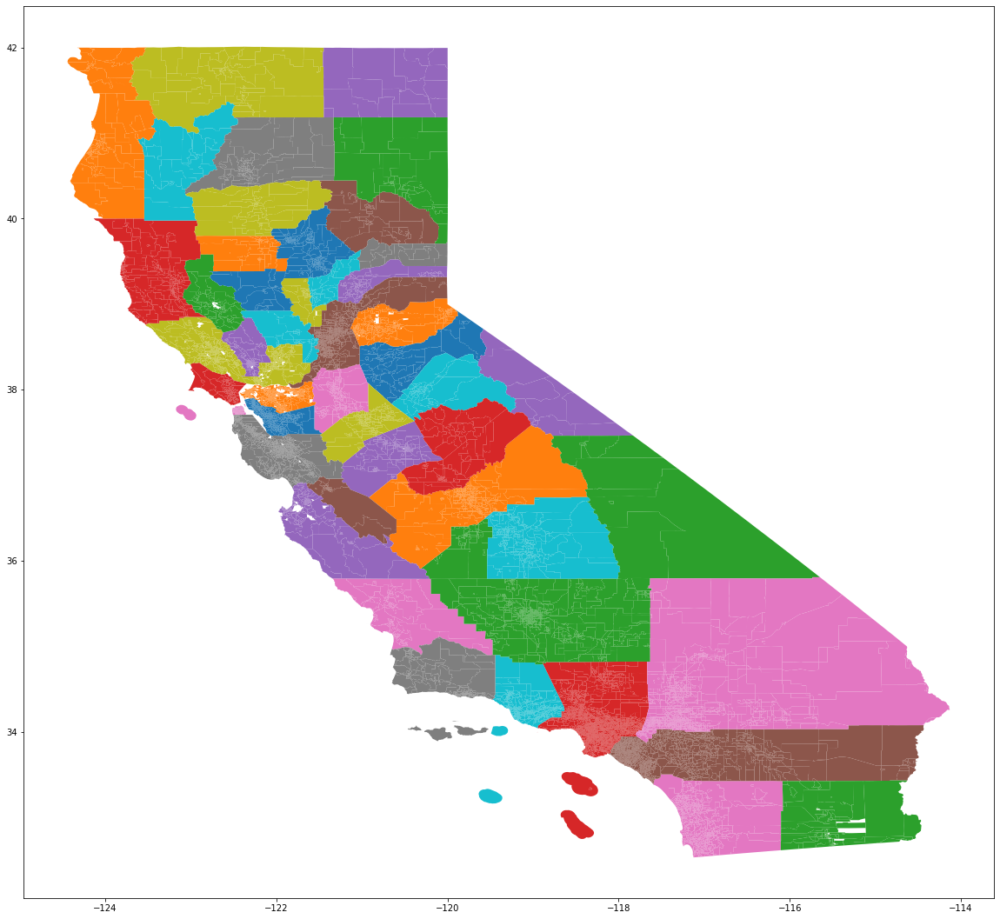

In [72]:
ca_shape1.plot(column='COUNTY', figsize=(20,20))
ca_shape1.head

In [50]:
ca_shape = gp.GeoDataFrame(gp.read_file("./raw-from-source/source/County Shape Files/statewide/srprec_state_g20_v01_shp.shp"),crs='EPSG:4326')
ca_shape.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

<AxesSubplot:>

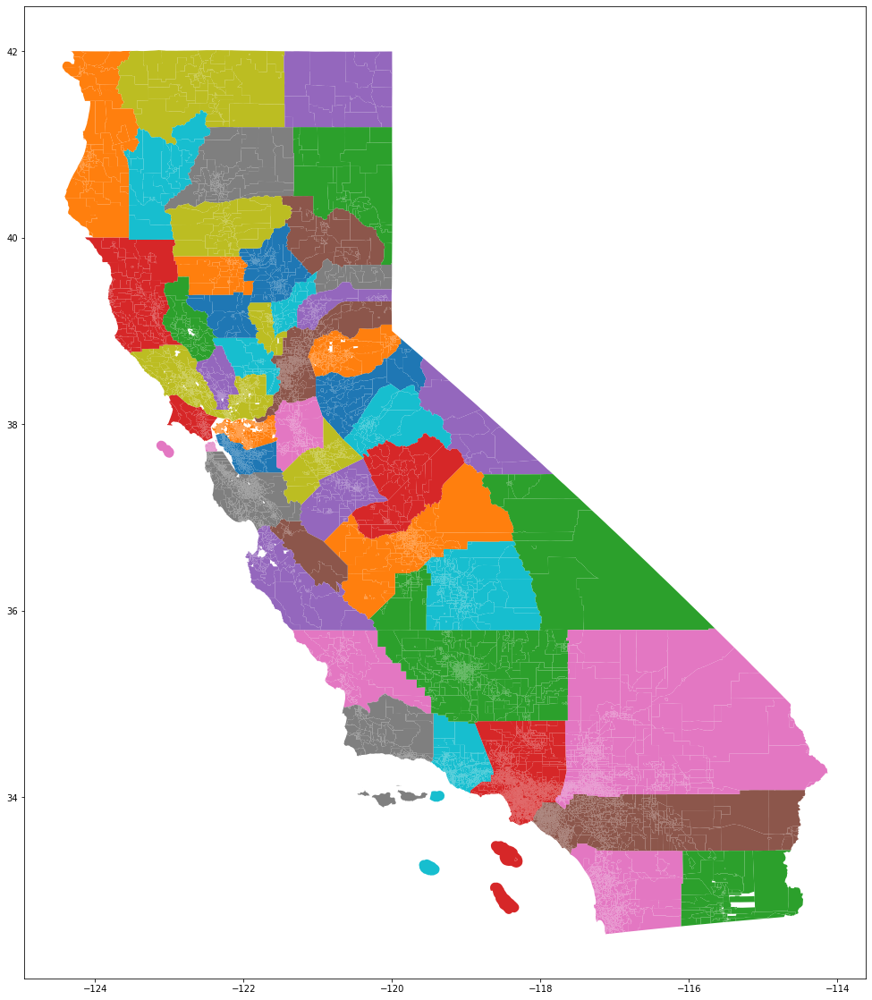

In [51]:
ca_shape.plot(column='COUNTY', figsize=(20,20))

## Join Elections Results to Shapefile

In [52]:
source_join = pd.merge(final_df,ca_shape,how="outer",on="SRPREC_KEY",indicator=True,validate='1:1')
#print(source_join["_merge"].value_counts())

In [53]:
#changing datatypes and filling zeroes to 12 positions
drop_join["SRPREC_KEY"] = drop_join["SRPREC_KEY"].astype(str)
drop_join["SRPREC_KEY"] = drop_join["SRPREC_KEY"].str.strip()
drop_join["SRPREC_KEY"] = drop_join["SRPREC_KEY"].str.zfill(12)

<ipython-input-53-68dbc71f206d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  drop_join["SRPREC_KEY"] = drop_join["SRPREC_KEY"].astype(str)
<ipython-input-53-68dbc71f206d>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  drop_join["SRPREC_KEY"] = drop_join["SRPREC_KEY"].str.strip()
<ipython-input-53-68dbc71f206d>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http

In [54]:
#changing datatypes and filling zeroes to 12 positions
ca_shape["SRPREC_KEY"] = ca_shape["SRPREC_KEY"].astype(str)
ca_shape["SRPREC_KEY"] = ca_shape["SRPREC_KEY"].str.strip()
ca_shape["SRPREC_KEY"] = ca_shape["SRPREC_KEY"].str.zfill(12)

In [55]:
source_joinx = pd.merge(drop_join,ca_shape,how="outer",on="SRPREC_KEY",indicator="secondary_merge",validate='1:1')
print(source_joinx["secondary_merge"].value_counts())


both          20038
left_only       166
right_only       13
Name: secondary_merge, dtype: int64


In [56]:
#list(source_joinx[source_joinx["secondary_merge"]=="left_only"]["SRPREC_KEY"])

In [57]:
#list(source_joinx[source_joinx["secondary_merge"]=="right_only"]["SRPREC_KEY"])

In [58]:
#source_joinx["SRPREC_KEY"].value_counts()

In [73]:
vest_shape = gp.read_file('./raw-from-source/vest/ca_2020.shp')
vest_shape= vest_shape.to_crs('EPSG:4326')
vest_shape.crs == ca_shape.crs
vest_shape.head

<bound method NDFrame.head of         COUNTY CNTY_CODE FIPS_CODE  SRPREC_KEY  SRPREC  ADDIST  CDDIST  \
0      Alameda         1      6001  6001481430  481430      20      15   
1      Alameda         1      6001  6001430420  430420      20      15   
2      Alameda         1      6001  6001430410  430410      20      15   
3      Alameda         1      6001  6001430500  430500      20      15   
4      Alameda         1      6001  6001430130  430130      20      15   
...        ...       ...       ...         ...     ...     ...     ...   
20794     Yuba        58      6115    61159511    9511       3       3   
20795     Yuba        58      6115    61159510    9510       3       3   
20796     Yuba        58      6115    61159513    9513       3       3   
20797     Yuba        58      6115    61159304    9304       3       3   
20798     Yuba        58      6115    61159512    9512       3       3   

       SDDIST  BEDIST  G20PREDBID  G20PRERTRU  G20PRELJOR  G20PREGHAW  \
0       

In [60]:
vest_dupe_remove = vest_shape[~vest_shape["SRPREC_KEY"].isin(['60857000',
 '60855000',
 '60975199',
 '60853000',
 '60853500',
 '60852000',
 '60690000000',
 '60853300',
 '60859000',
 '60859300',
 '60854400',
 '60854600',
 '60750000',
 '60852300',
 '60852500',
 '60852200'])]
vest_dupe_remove["SRPREC_KEY"].value_counts()

608750099        1
60539321         1
609599974        1
060379001799A    1
060379001805A    1
                ..
060235MK-5       1
60757008         1
060379000049A    1
060379001770A    1
60650024830      1
Name: SRPREC_KEY, Length: 20403, dtype: int64

<AxesSubplot:>

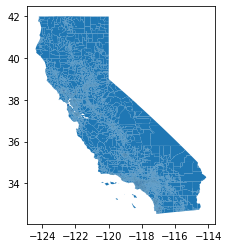

In [61]:
vest_dupe_remove.plot()

In [62]:
vest_dupe_remove["SRPREC_KEY"] = vest_dupe_remove["SRPREC_KEY"].astype(str)
vest_dupe_remove["SRPREC_KEY"] = vest_dupe_remove["SRPREC_KEY"].str.strip()
vest_dupe_remove["SRPREC_KEY"] = vest_dupe_remove["SRPREC_KEY"].str.zfill(12)
list(vest_dupe_remove["SRPREC_KEY"])

C:\Users\Chris\anaconda3\lib\site-packages\geopandas\geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


['006001481430',
 '006001430420',
 '006001430410',
 '006001430500',
 '006001430130',
 '006001481970',
 '006001431120',
 '006001430110',
 '006001481960',
 '006001430120',
 '006001430150',
 '006001481950',
 '006001481550',
 '006001431610',
 '006001447210',
 '006001431110',
 '006001420220',
 '006001481940',
 '006001482040',
 '006001491650',
 '006001431210',
 '006001481110',
 '006001520730',
 '006001450930',
 '006001835050',
 '006001447510',
 '006001839220',
 '006001456610',
 '006001454230',
 '006001450620',
 '006001420240',
 '006001323400',
 '006001834030',
 '006001482050',
 '006001207640',
 '006001831220',
 '006001394200',
 '006001443720',
 '006001839380',
 '006001454600',
 '006001344020',
 '006001430010',
 '006001202010',
 '006001431500',
 '006001821310',
 '006001430020',
 '006001424200',
 '006001484000',
 '006001491410',
 '006001333300',
 '006001204000',
 '006001520910',
 '006001480010',
 '006001420010',
 '006001520900',
 '006001224300',
 '006001416220',
 '006001510990',
 '006001454510

In [63]:
final_shape_merge = pd.merge(source_joinx, vest_dupe_remove, how="outer",on="SRPREC_KEY",indicator="tert_merge",validate='1:1')
final_shape_merge.value_counts('tert_merge')

tert_merge
both          20204
right_only      199
left_only        13
dtype: int64

In [64]:
list(final_shape_merge[final_shape_merge["tert_merge"]=="left_only"]["SRPREC_KEY"])

['00006.02E-22',
 '00006.02E-24',
 '00006.02E-26',
 '00006.02E-43',
 '00.000000602',
 '00006.02E-16',
 '00006.02E-28',
 '00006.02E-37',
 '00006.02E-47',
 '00006027104A',
 '00006027119A',
 '006025482031',
 '006025584014']

In [65]:
list(final_shape_merge[final_shape_merge["tert_merge"]=="right_only"]["SRPREC_KEY"])

['06013ALMO901',
 '06013ANTI901',
 '06013ANTI904',
 '06013ANTI905',
 '06013ANTI906',
 '06013ANTI907',
 '06013ANTI908',
 '06013ANTI909',
 '06013ANTI910',
 '06013ANTI911',
 '06013ANTI912',
 '06013BAPO901',
 '06013BAPO902',
 '06013BAPO903',
 '06013BAPO904',
 '06013BETH901',
 '06013BKDI901',
 '06013BKDI902',
 '06013BKDI903',
 '06013BKDI904',
 '06013BKDI905',
 '06013BKDI906',
 '06013BKDI907',
 '06013BKDI908',
 '06013BKDI909',
 '06013BKHW901',
 '06013BREN901',
 '06013BREN902',
 '06013BREN903',
 '06013BRHL901',
 '06013BYRN901',
 '06013CALD901',
 '06013CALD902',
 '06013CONC901',
 '06013CONC902',
 '06013CONC903',
 '06013CONC904',
 '06013CONC905',
 '06013CONC906',
 '06013CROC901',
 '06013DANV901',
 '06013DANV902',
 '06013DANV903',
 '06013DANV904',
 '06013ELSO901',
 '06013ELSO902',
 '06013ELSO903',
 '06013ELSO904',
 '06013HERC901',
 '06013KENS901',
 '06013KENS902',
 '06013KENS903',
 '06013LAST901',
 '06013LFET901',
 '06013LFET902',
 '06013MART901',
 '06013MART902',
 '06013MART903',
 '06013MART904

## Source and Vest Geometry Validation

In [66]:
# Creating two data frames with the two shape geometries
both = final_shape_merge[final_shape_merge["tert_merge"]=="both"]
vest_geoms = gp.GeoDataFrame(both,geometry="geometry_y", crs=vest_dupe_remove.crs)
source_geoms = gp.GeoDataFrame(both,geometry="geometry_x",crs=vest_dupe_remove.crs)
source_geoms = source_geoms.to_crs(3857)
vest_geoms = vest_geoms.to_crs(3857)
source_geoms["geometry_x"]=source_geoms.buffer(0)
vest_geoms["geometry_y"]=vest_geoms.buffer(0)
vals = source_geoms.geom_almost_equals(vest_geoms,decimal=0)
print(vals.value_counts())

False    20197
True         7
dtype: int64


1) For 000000060031 difference in area is 8.759590969846835
2) For 000000060032 difference in area is 5.389909332284913
3) For 000000060034 difference in area is 9.12128998005127
4) For 000006011106 difference in area is 8.701757240497091
5) For 000006011407 difference in area is 8.612277159067615
6) For 000000601507 difference in area is 28.086386948941463
7) For 000000601508 difference in area is 11.073521065884323
8) For 000000601509 difference in area is 15.83603615890624
9) For 000000601510 difference in area is 26.312524547218747
10) For 000000601512 difference in area is 27.725057049958743
11) For 000000601515 difference in area is 26.084405432485394
12) For 000000601517 difference in area is 45.6261969887835
13) For 000000601518 difference in area is 32.38532696898126
14) For 006017330-26 difference in area is 5.410208721574261
15) For 060179501-26 difference in area is 5.625972958748639
16) For 060179501-43 difference in area is 9.935674962321299
17) For 060179503-26 differenc

C:\Users\Chris\anaconda3\lib\site-packages\geopandas\plotting.py:384: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


22) For 0000060235BL difference in area is 5.474528531234819
23) For 00060235KT-1 difference in area is 8.964957377200056
24) For 00060235KT-4 difference in area is 9.852838490507663
25) For 00060235KT-6 difference in area is 5.8828896023393815
26) For 0000060235MC difference in area is 10.235158918845073
27) For 006025285001 difference in area is 38.836912719579594
28) For 006025285002 difference in area is 13.376499171411547
29) For 006025285007 difference in area is 9.167878356350808
30) For 006025384122 difference in area is 54.95445404920969
31) For 006025385005 difference in area is 45.84588195660275
32) For 006025385014 difference in area is 16.609977761458335
33) For 006025385015 difference in area is 30.361361390269362
34) For 006025385017 difference in area is 5.846490352224715
35) For 006025481116 difference in area is 8.904098787962074
36) For 006025482018 difference in area is 26.200427821178266
37) For 006025482026 difference in area is 11.782266338731084
38) For 00602548

154) For 060890000520 difference in area is 7.857847886475061
155) For 060890000590 difference in area is 121.77336430548331
156) For 060890000990 difference in area is 7.224615885146197
157) For 000006091001 difference in area is 12.606945426756077
158) For 000006091002 difference in area is 8.01676071454474
159) For 000006091003 difference in area is 6.670502467043463
160) For 000006091004 difference in area is 8.749333745708054
161) For 000006091007 difference in area is 17.80833535488621
162) For 000006091008 difference in area is 18.909231761050243
163) For 000006091013 difference in area is 5.718028857719241
164) For 000006091014 difference in area is 19.842639237166825
165) For 000006091015 difference in area is 7.200427438519114
166) For 000006091020 difference in area is 8.191828351936454
167) For 000006091023 difference in area is 6.252288215695014
168) For 0006093M1001 difference in area is 6.154269634562902
169) For 0006093M1004 difference in area is 5.4525238452995515
170)

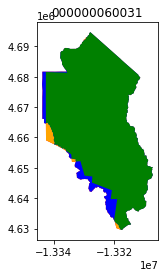

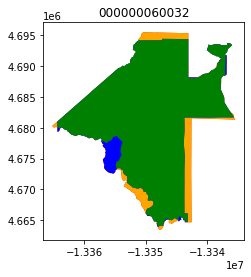

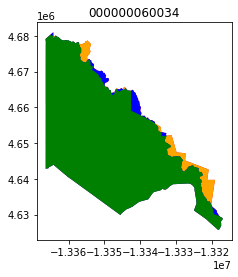

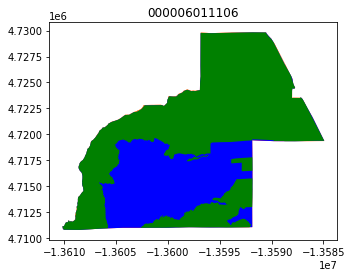

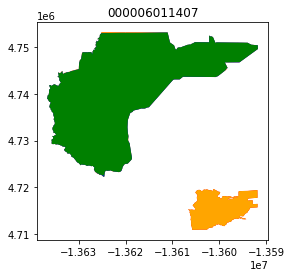

...

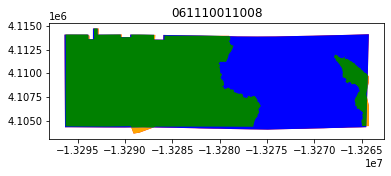

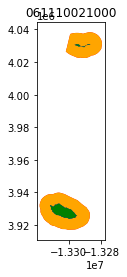

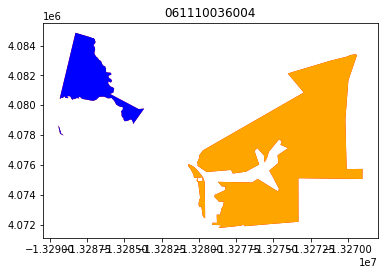

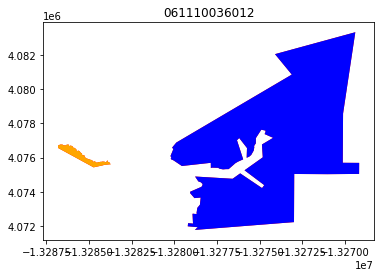

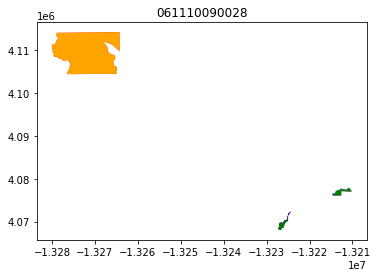

In [67]:
#Validation Function
count = 0
area_list = []
for i in range(0,len(source_geoms)):
    diff = source_geoms.iloc[[i]].symmetric_difference(vest_geoms.iloc[[i]])
    intersection = source_geoms.iloc[[i]].intersection(vest_geoms.iloc[[i]])
    area = float(diff.area/10e6)
    area_list.append(area)
    #print("Area is " + str(area))

    if (area > 5):
        count += 1
        name = source_geoms.iat[i,0]
        
        print(str(count)+") For " + name + " difference in area is " + str(area))
        if (intersection.iloc[0].is_empty):
            base = diff.plot(color="red")
            source_geoms.iloc[[i]].plot(color="orange",ax=base)
            vest_geoms.iloc[[i]].plot(color="blue",ax=base)
            base.set_title(name)
        else:
            base = diff.plot(color="red")
            source_geoms.iloc[[i]].plot(color="orange",ax=base)
            vest_geoms.iloc[[i]].plot(color="blue",ax=base)
            intersection.plot(color="green",ax=base)
            base.set_title(name)

In [68]:
df = pd.DataFrame(area_list)
print(df.shape)

print(str(len(df[df[0]==0]))+" precincts w/ a difference of 0 km^2")
print(str(len(df[(df[0]<.1) & (df[0]>0)]))+ " precincts w/ a difference between 0 and .1 km^2")
print(str(len(df[(df[0]<.5) & (df[0]>=.1)]))+ " precincts w/ a difference between .1 and .5 km^2")
print(str(len(df[(df[0]<1) & (df[0]>=.5)]))+ " precincts w/ a difference between .5 and 1 km^2")
print(str(len(df[(df[0]<2) & (df[0]>=1)]))+ " precincts w/ a difference between 1 and 2 km^2")
print(str(len(df[(df[0]<5) & (df[0]>=2)]))+ " precincts w/ a difference between 2 and 5 km^2")
print(str(len(df[(df[0]>=5)]))+ " precincts w/ a difference greater than 5 km^2")

(20204, 1)
0 precincts w/ a difference of 0 km^2
17715 precincts w/ a difference between 0 and .1 km^2
1414 precincts w/ a difference between .1 and .5 km^2
322 precincts w/ a difference between .5 and 1 km^2
214 precincts w/ a difference between 1 and 2 km^2
182 precincts w/ a difference between 2 and 5 km^2
200 precincts w/ a difference greater than 5 km^2


## Alameda Spot Check

In [47]:
#Load the file
ala_shape = gp.read_file('./raw-from-source/source/County Shape Files/Alameda/County/Consolidated_Precincts_-_November_3%2C_2020_General_Election.shp', crs='3857')

In [49]:
#rename unique id column
ala_shape = ala_shape.rename(columns={'Precinct_I':'SRPREC'})
ala_shape.reset_index(inplace=True)

In [50]:
#Spot checking just Alameda
vest_alameda = vest_shape[vest_shape["COUNTY"].isin(['Alameda'])]

In [51]:
# Converting both dataframes to string
vest_alameda['SRPREC'] = vest_alameda['SRPREC'].astype(str)
ala_shape['SRPREC'] = ala_shape['SRPREC'].astype(str)
alameda_merge = pd.merge(ala_shape, vest_alameda, how="outer",on="SRPREC",indicator="_merge",validate='1:1')

C:\Users\Chris\anaconda3\lib\site-packages\geopandas\geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


In [52]:
alameda_merge.value_counts("_merge")

_merge
both          521
left_only       0
right_only      0
dtype: int64

In [53]:
both = alameda_merge[alameda_merge["_merge"]=="both"]
vest_geoms = gp.GeoDataFrame(both,geometry="geometry_y", crs=ala_shape.crs)
source_geoms = gp.GeoDataFrame(both,geometry="geometry_x",crs=ala_shape.crs)
source_geoms = source_geoms.to_crs(3857)
vest_geoms = vest_geoms.to_crs(3857)
source_geoms["geometry_x"]=source_geoms.buffer(0)
vest_geoms["geometry_y"]=vest_geoms.buffer(0)
vals = source_geoms.geom_almost_equals(vest_geoms,decimal=0)
print(vals.value_counts())

True     515
False      6
dtype: int64


1) For 261300 difference in area is 8.07086974688757e-12
2) For 305100 difference in area is 2.5115908555329962e-11
3) For 303800 difference in area is 1.7771646757935508e-11
4) For 302700 difference in area is 1.3569670140780101e-11
5) For 302000 difference in area is 1.937783296177397e-11
6) For 209900 difference in area is 1.7403883649759737e-11
7) For 301900 difference in area is 2.565871791299773e-11
8) For 300130 difference in area is 1.9666431082197583e-11
9) For 450800 difference in area is 1.7488996732355297e-11
10) For 208810 difference in area is 9.56660304925333e-12
11) For 450930 difference in area is 8.372948094164355e-13
12) For 209200 difference in area is 5.136517189416497e-12
13) For 450200 difference in area is 1.3330695916640139e-11
14) For 501900 difference in area is 2.1259243009877013e-11
15) For 501640 difference in area is 1.8158957373550032e-11
16) For 305700 difference in area is 1.704472006235731e-11
17) For 301200 difference in area is 2.1587680337304716e-1

C:\Users\Chris\anaconda3\lib\site-packages\geopandas\plotting.py:384: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


23) For 205200 difference in area is 1.2743580561534652e-11
24) For 208600 difference in area is 3.173787872141898e-12
25) For 456610 difference in area is 7.182500476926937e-13
26) For 456500 difference in area is 5.099433229456898e-12
27) For 454220 difference in area is 3.6375121055712277e-12
28) For 454600 difference in area is 2.2783344960239373e-12
29) For 206200 difference in area is 6.7223303232025364e-12
30) For 430800 difference in area is 7.823142603282598e-12
31) For 535600 difference in area is 4.5415622858383836e-12
32) For 454100 difference in area is 1.0497577446973075e-11
33) For 205700 difference in area is 1.091837399805392e-11
34) For 455100 difference in area is 6.026901701474546e-12
35) For 457300 difference in area is 8.71553574322316e-12
36) For 457500 difference in area is 7.473441864645423e-12
37) For 207000 difference in area is 7.598028918107385e-12
38) For 200100 difference in area is 1.6365507426186356e-11
39) For 456200 difference in area is 1.59704787127

160) For 430420 difference in area is 2.2732559476568506e-13
161) For 839380 difference in area is 1.5688351088622398e-12
162) For 440610 difference in area is 1.3376752285125439e-11
163) For 824100 difference in area is 9.507861817152803e-12
164) For 440300 difference in area is 1.886089978746135e-11
165) For 481200 difference in area is 7.648593517801342e-12
166) For 520220 difference in area is 6.501155957908982e-11
167) For 443800 difference in area is 4.166401544733207e-12
168) For 821900 difference in area is 2.257781867859047e-11
169) For 443710 difference in area is 5.329458512396291e-12
170) For 447010 difference in area is 4.836659580896661e-12
171) For 822000 difference in area is 1.8433453801560817e-11
172) For 839300 difference in area is 2.388377847908638e-11
173) For 424500 difference in area is 7.939435596130642e-12
174) For 821800 difference in area is 1.5351949100827437e-11
175) For 443720 difference in area is 1.5655882444232105e-12
176) For 442700 difference in area

297) For 510970 difference in area is 3.0845351367505236e-12
298) For 510990 difference in area is 2.160828387110913e-12
299) For 535080 difference in area is 1.6952369572342025e-11
300) For 835830 difference in area is 1.5201063580600262e-11
301) For 432200 difference in area is 1.411085143201568e-11
302) For 421800 difference in area is 1.0070603488907156e-11
303) For 832800 difference in area is 1.515552719703432e-11
304) For 535020 difference in area is 2.9048603873796723e-12
305) For 422810 difference in area is 1.539718120834232e-11
306) For 832810 difference in area is 1.0705114608021427e-11
307) For 535040 difference in area is 4.034329307272145e-12
308) For 423000 difference in area is 1.5081828030883825e-11
309) For 422920 difference in area is 1.4655578549030954e-11
310) For 866810 difference in area is 9.690291846801676e-11
311) For 835310 difference in area is 6.735584208684281e-12
312) For 535700 difference in area is 7.544158278857682e-12
313) For 433630 difference in ar

433) For 432010 difference in area is 1.3419592487167331e-11
434) For 491600 difference in area is 1.6592858325130758e-11
435) For 325400 difference in area is 5.909068435486307e-12
436) For 325500 difference in area is 4.410020400388501e-12
437) For 225300 difference in area is 9.061087268641237e-12
438) For 223010 difference in area is 1.250963267635458e-11
439) For 215700 difference in area is 1.0134023157015205e-11
440) For 215500 difference in area is 5.808140527533128e-12
441) For 215200 difference in area is 9.777455524561523e-12


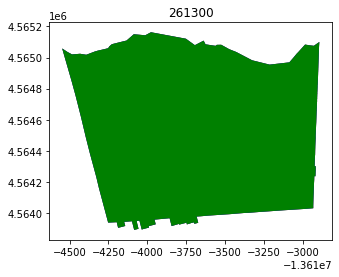

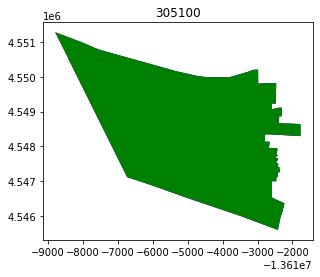

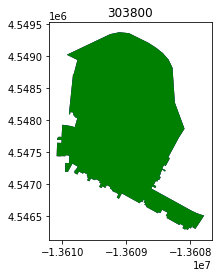

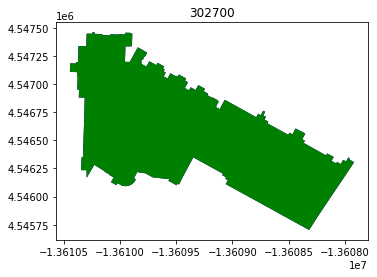

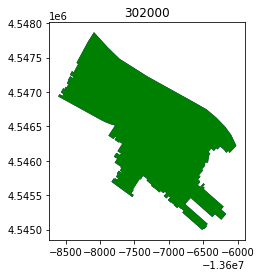

...

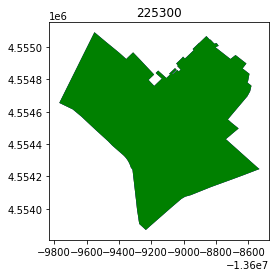

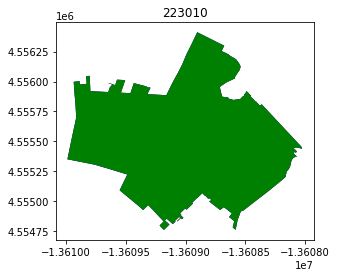

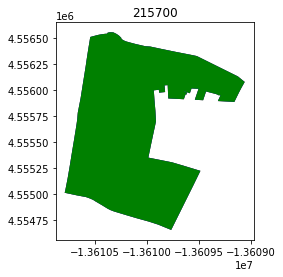

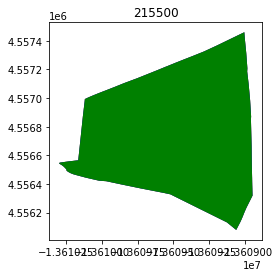

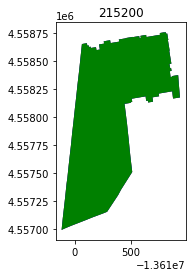

In [54]:
count = 0
area_list = []
for i in range(0,len(source_geoms)):
    diff = source_geoms.iloc[[i]].symmetric_difference(vest_geoms.iloc[[i]])
    intersection = source_geoms.iloc[[i]].intersection(vest_geoms.iloc[[i]])
    area = float(diff.area/10e6)
    area_list.append(area)
    #print("Area is " + str(area))

    if (area > 0):
        count += 1
        name = source_geoms.iat[i,1]
        
        print(str(count)+") For " + name + " difference in area is " + str(area))
        if (intersection.iloc[0].is_empty):
            base = diff.plot(color="red")
            source_geoms.iloc[[i]].plot(color="orange",ax=base)
            vest_geoms.iloc[[i]].plot(color="blue",ax=base)
            base.set_title(name)
        else:
            base = diff.plot(color="red")
            source_geoms.iloc[[i]].plot(color="orange",ax=base)
            vest_geoms.iloc[[i]].plot(color="blue",ax=base)
            intersection.plot(color="green",ax=base)
            base.set_title(name)

In [55]:
df = pd.DataFrame(area_list)
print(df.shape)

print(str(len(df[df[0]==0]))+" precincts w/ a difference of 0 km^2")
print(str(len(df[(df[0]<.1) & (df[0]>0)]))+ " precincts w/ a difference between 0 and .1 km^2")
print(str(len(df[(df[0]<.5) & (df[0]>=.1)]))+ " precincts w/ a difference between .1 and .5 km^2")
print(str(len(df[(df[0]<1) & (df[0]>=.5)]))+ " precincts w/ a difference between .5 and 1 km^2")
print(str(len(df[(df[0]<2) & (df[0]>=1)]))+ " precincts w/ a difference between 1 and 2 km^2")
print(str(len(df[(df[0]<5) & (df[0]>=2)]))+ " precincts w/ a difference between 2 and 5 km^2")
print(str(len(df[(df[0]>=5)]))+ " precincts w/ a difference greater than 5 km^2")

(521, 1)
80 precincts w/ a difference of 0 km^2
441 precincts w/ a difference between 0 and .1 km^2
0 precincts w/ a difference between .1 and .5 km^2
0 precincts w/ a difference between .5 and 1 km^2
0 precincts w/ a difference between 1 and 2 km^2
0 precincts w/ a difference between 2 and 5 km^2
0 precincts w/ a difference greater than 5 km^2


In [ ]:
list(area_list)

<AxesSubplot:>

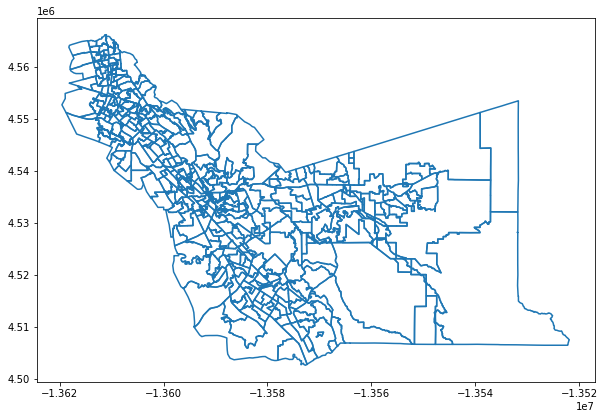

In [64]:
source_geoms.boundary.plot(figsize=(10,10))

<AxesSubplot:>

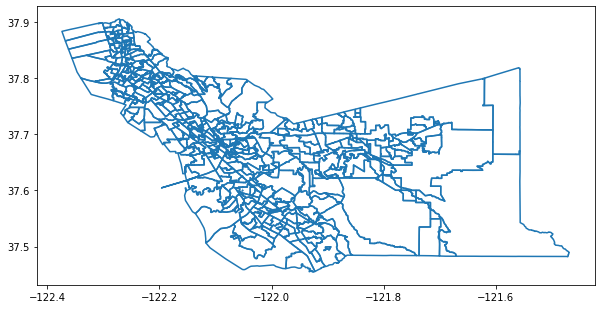

In [63]:
al_shape = ca_shape[ca_shape["COUNTY"].isin(['001'])]
al_shape.boundary.plot(figsize=(10,10))

In [79]:
county_lines = gp.read_file('./raw-from-source/2018 County Lines/cb_2018_us_county_5m.shp')

In [76]:
county_lines = county_lines[county_lines["STATEFP"].isin(['06'])]

county_lines = county_lines[county_lines["COUNTYFP"].isin(['001'])]

<bound method GeoSeries.plot of 1715    LINESTRING (-122.33371 37.80980, -122.32357 37...
dtype: geometry>

<AxesSubplot:>

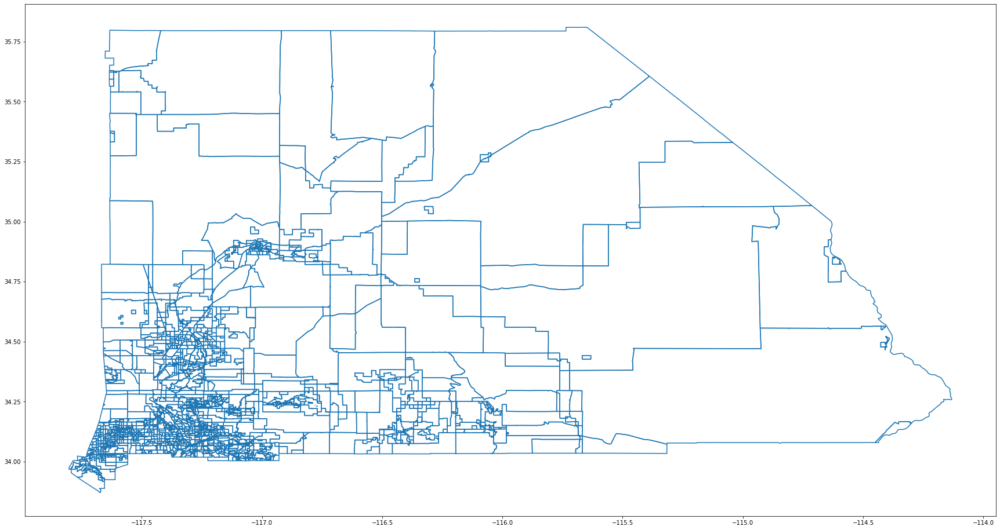

In [207]:
kern_lines = ca_shape[ca_shape["COUNTY"].isin(['071'])]

kern_lines.boundary.plot(figsize=(30,30))

<AxesSubplot:>

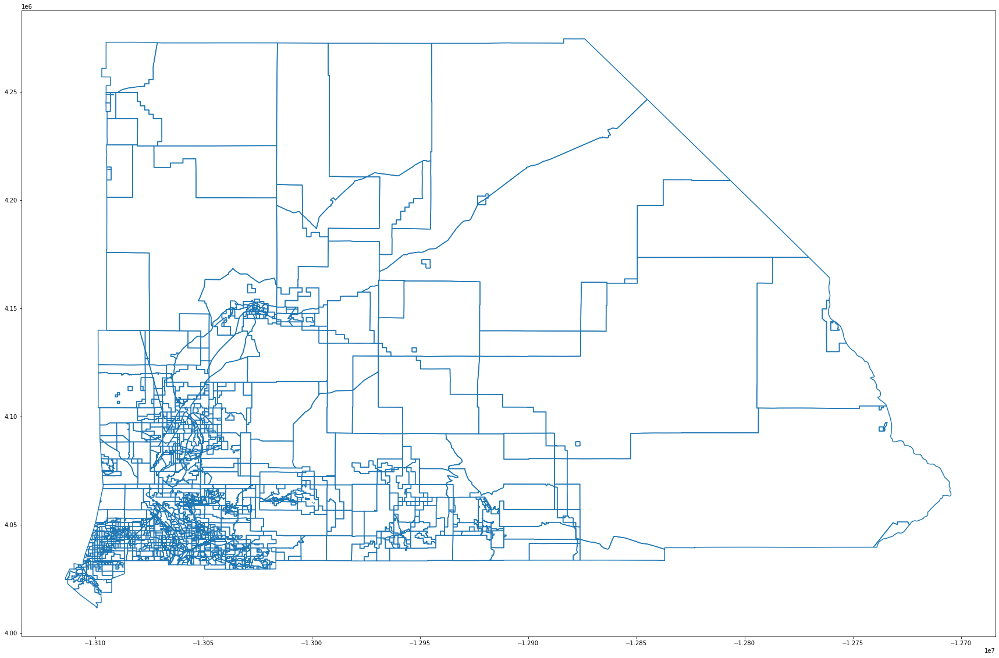

In [208]:
kern_vest = vest_dupe_remove[vest_dupe_remove["COUNTY"].isin(["San Bernardino"])]
kern_vest.boundary.plot(figsize=(30,30))

In [209]:
kern_vest = kern_vest.to_crs(3857)
#kern_lines = kern_lines.set_crs(epsg=3857, allow_override=True)
kern_lines = kern_lines.to_crs(3857)


<AxesSubplot:>

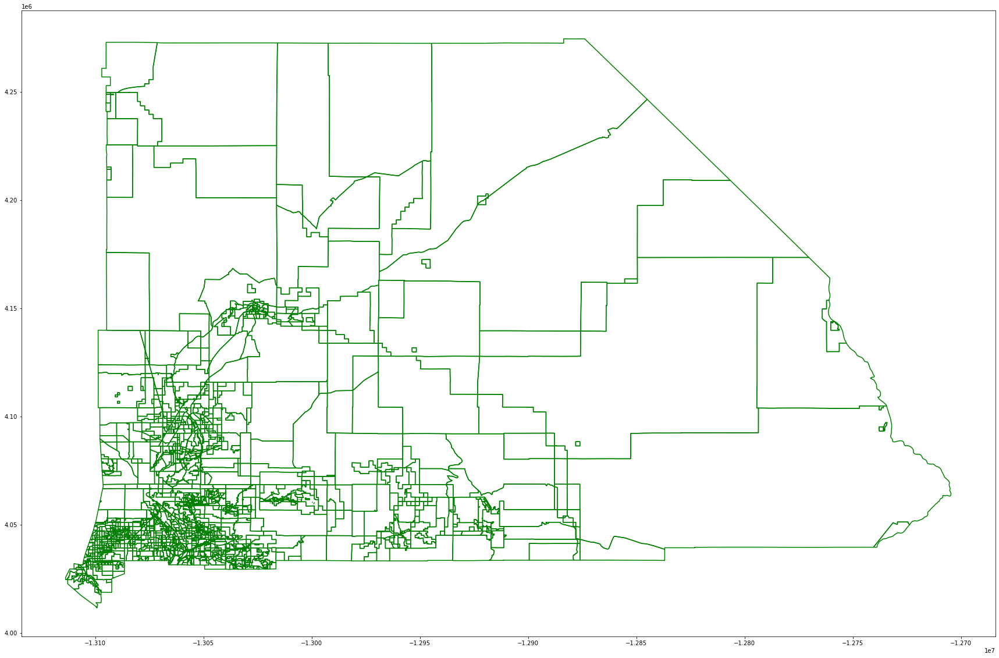

In [210]:
fig, ax = plt.subplots(figsize=(30, 30))
kern_vest.boundary.plot(ax=ax, color = 'green')
#kern_lines.boundary.plot(ax=ax, color='red')

<AxesSubplot:>

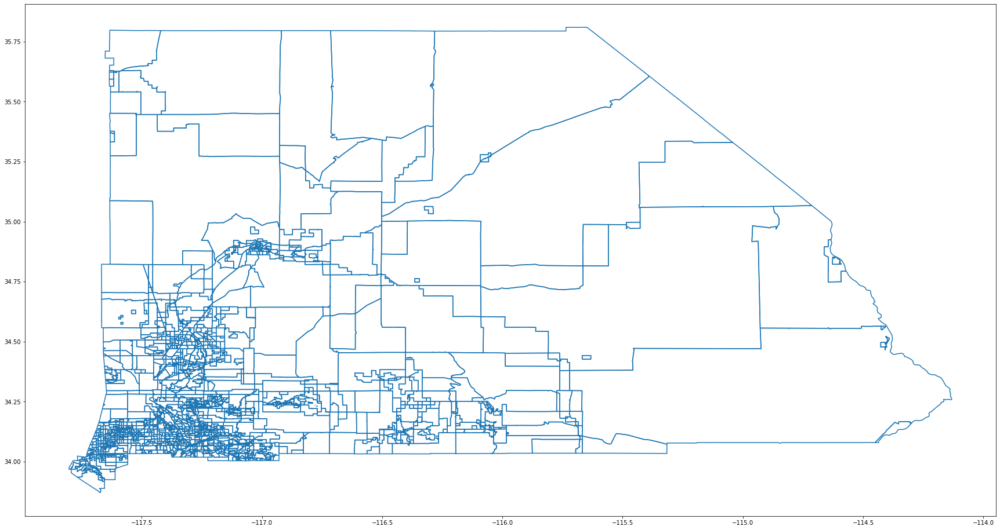

In [211]:
kern_lines.boundary.plot(figsize=(30,30))

<AxesSubplot:>

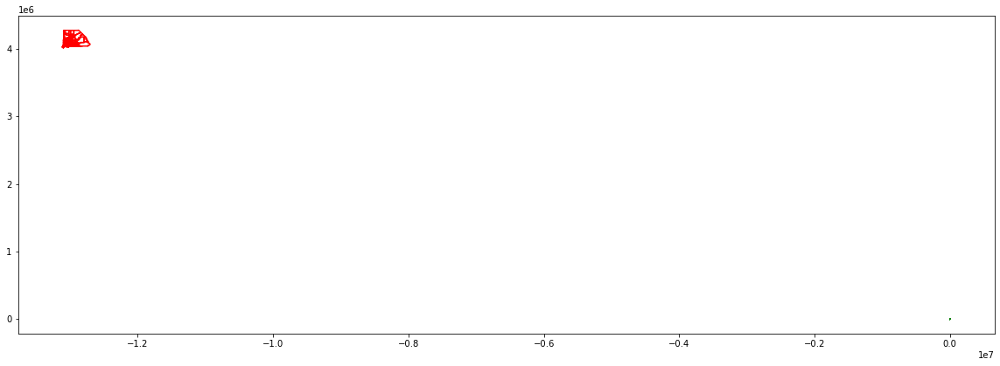

In [212]:
ax = kern_lines.boundary.plot(figsize=(20,20),color="green")
kern_vest.boundary.plot(figsize=(20,20),ax=ax,color="red")


In [173]:
kern_vest.crs

<Projected CRS: EPSG:3857>
Name: WGS 84 / Pseudo-Mercator
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: World between 85.06°S and 85.06°N.
- bounds: (-180.0, -85.06, 180.0, 85.06)
Coordinate Operation:
- name: Popular Visualisation Pseudo-Mercator
- method: Popular Visualisation Pseudo Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [174]:
kern_lines.crs

<Projected CRS: EPSG:3857>
Name: WGS 84 / Pseudo-Mercator
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: World between 85.06°S and 85.06°N.
- bounds: (-180.0, -85.06, 180.0, 85.06)
Coordinate Operation:
- name: Popular Visualisation Pseudo-Mercator
- method: Popular Visualisation Pseudo Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich